In [ ]:
!pip install category_encoders==2.*
!pip install pandas-profiling==2.*

In [ ]:
!pip install scikit-optimize

In [ ]:
!pip install -U imbalanced-learn

In [ ]:
!pip install eli5

In [150]:
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


import warnings
warnings.filterwarnings("ignore")

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression 
from sklearn.model_selection import train_test_split, cross_val_score, validation_curve, GridSearchCV, RandomizedSearchCV, KFold, cross_validate, RepeatedStratifiedKFold, StratifiedKFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, Normalizer
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, recall_score, f1_score, roc_auc_score, precision_recall_curve, average_precision_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.feature_selection import SelectKBest, chi2, VarianceThreshold, RFECV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
import category_encoders
from category_encoders import OneHotEncoder, OrdinalEncoder
from pandas_profiling import ProfileReport
from scipy.stats import randint, boxcox
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

import eli5
from eli5.sklearn import PermutationImportance

import xgboost as xgb
from xgboost import XGBClassifier

from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

In [151]:
df = pd.read_csv(r'C:\Users\trewq\OneDrive\Documents\Lambda\BankruptcyDataset.csv')
df.head()

def wrangle(df):
    # remove white space in columns names
    df.columns = df.columns.str.strip()
    # replace spaces in columns names with underscore
    df.columns = df.columns.str.replace(' ','_')
    # replace df['Net_Income_to_Stockholder's_Equity'] 
    # with df['Net_Income_to_Stockholders_Equity']
    df.columns = df.columns.str.replace('\'','')
    # Drop constant columns
    df.drop(columns=['Net_Income_Flag'], inplace=True)
    # drop duplicate column
    df.drop(columns=['Current_Liability_to_Equity'], inplace=True)
    
    return df    

In [152]:
# wrangle into the DataFrame
df = wrangle(df)
df.shape

(6819, 94)

In [153]:
# Find baseline accuracy using most common class for classification 
baseline_acc = df['Bankrupt?'].value_counts(normalize=True).max()

print('Most common class <MODE> is:', round(baseline_acc*100,3),'%')
print('\nProbability of Continuing as Going Concern: ', round(baseline_acc*100,3),'%')
print('Probability of Business Bankruptcy', round(100-baseline_acc*100,3),'%')

Most common class <MODE> is: 96.774 %

Probability of Continuing as Going Concern:  96.774 %
Probability of Business Bankruptcy 3.226 %


In [154]:
# look at the statistics of categorical variables
df.describe()

,Bankrupt?,ROA(C)_before_interest_and_depreciation_before_interest,ROA(A)_before_interest_and_%_after_tax,ROA(B)_before_interest_and_depreciation_after_tax,Operating_Gross_Margin,Realized_Sales_Gross_Margin,Operating_Profit_Rate,Pre-tax_net_Interest_Rate,After-tax_net_Interest_Rate,Non-industry_income_and_expenditure/revenue,Continuous_interest_rate_(after_tax),Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest-bearing_debt_interest_rate,Tax_rate_(A),Net_Value_Per_Share_(B),Net_Value_Per_Share_(A),Net_Value_Per_Share_(C),Persistent_EPS_in_the_Last_Four_Seasons,Cash_Flow_Per_Share,Revenue_Per_Share_(Yuan_¥),Operating_Profit_Per_Share_(Yuan_¥),Per_Share_Net_profit_before_tax_(Yuan_¥),Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,After-tax_Net_Profit_Growth_Rate,Regular_Net_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Cash_Reinvestment_%,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_debt/Total_net_worth,Debt_ratio_%,Net_worth/Assets,Long-term_fund_suitability_ratio_(A),Borrowing_dependency,Contingent_liabilities/Net_worth,Operating_profit/Paid-in_capital,Net_profit_before_tax/Paid-in_capital,Inventory_and_accounts_receivable/Net_value,Total_Asset_Turnover,Accounts_Receivable_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_(times),Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_(times),Revenue_per_person,Operating_profit_per_person,Allocation_rate_per_person,Working_Capital_to_Total_Assets,Quick_Assets/Total_Assets,Current_Assets/Total_Assets,Cash/Total_Assets,Quick_Assets/Current_Liability,Cash/Current_Liability,Current_Liability_to_Assets,Operating_Funds_to_Liability,Inventory/Working_Capital,Inventory/Current_Liability,Current_Liabilities/Liability,Working_Capital/Equity,Current_Liabilities/Equity,Long-term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_income/Total_expense,Total_expense/Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Working_capitcal_Turnover_Rate,Cash_Turnover_Rate,Cash_Flow_to_Sales,Fixed_Assets_to_Assets,Current_Liability_to_Liability,Equity_to_Long-term_Liability,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability-Assets_Flag,Net_Income_to_Total_Assets,Total_assets_to_GNP_price,No-credit_Interval,Gross_Profit_to_Sales,Net_Income_to_Stockholders_Equity,Liability_to_Equity,Degree_of_Financial_Leverage_(DFL),Interest_Coverage_Ratio_(Interest_expense_to_EBIT),Equity_to_Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.115001,0.190661,0.190633,0.190672,0.228813,0.323482,1.328641e+06,0

In [155]:
# pandas profile report to get an overview of the information
df.profile_report(minimal = True)

Summarize dataset:   0%|          | 0/102 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [156]:
df['Net_Income_to_Stockholders_Equity'].value_counts().sort_index(ascending=True)

0.000000    1
0.344652    1
0.442176    1
0.634587    1
0.637576    1
           ..
0.902744    1
0.916329    1
0.976180    1
0.996912    1
1.000000    1
Name: Net_Income_to_Stockholders_Equity, Length: 6819, dtype: int64

In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 94 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Bankrupt?                                                6819 non-null   int64  
 1   ROA(C)_before_interest_and_depreciation_before_interest  6819 non-null   float64
 2   ROA(A)_before_interest_and_%_after_tax                   6819 non-null   float64
 3   ROA(B)_before_interest_and_depreciation_after_tax        6819 non-null   float64
 4   Operating_Gross_Margin                                   6819 non-null   float64
 5   Realized_Sales_Gross_Margin                              6819 non-null   float64
 6   Operating_Profit_Rate                                    6819 non-null   float64
 7   Pre-tax_net_Interest_Rate                                6819 non-null   float64
 8   After-tax_net_Interest_Rate 

In [158]:
df_corr = df.corr()
df_corr.loc[:,['Bankrupt?']].sort_values('Bankrupt?').head(20)

,Bankrupt?
Net_Income_to_Total_Assets,-0.315457
ROA(A)_before_interest_and_%_after_tax,-0.282941
ROA(B)_before_interest_and_depreciation_after_tax,-0.273051
ROA(C)_before_interest_and_depreciation_before_interest,-0.260807
Net_worth/Assets,-0.250161
Persistent_EPS_in_the_Last_Four_Seasons,-0.219560
Retained_Earnings_to_Total_Assets,-0.217779
Net_profit_before_tax/Paid-in_capital,-0.207857
Per_Share_Net_profit_before_tax_(Yuan_¥),-0.201395
Working_Capital_to_Total_Assets,-0.193083


In [159]:
df_corr = df.corr()
df_corr.loc[:,['Bankrupt?']].sort_values('Bankrupt?').tail(10)

,Bankrupt?
Equity_to_Long-term_Liability,0.139014
Total_expense/Assets,0.139049
Liability-Assets_Flag,0.139212
Current_Liabilities/Equity,0.153828
Liability_to_Equity,0.166812
Current_Liability_to_Current_Assets,0.171306
Borrowing_dependency,0.176543
Current_Liability_to_Assets,0.194494
Debt_ratio_%,0.250161
Bankrupt?,1.000000


In [160]:
df_corr.sort_values('Bankrupt?', ascending=True).head(20)

,Bankrupt?,ROA(C)_before_interest_and_depreciation_before_interest,ROA(A)_before_interest_and_%_after_tax,ROA(B)_before_interest_and_depreciation_after_tax,Operating_Gross_Margin,Realized_Sales_Gross_Margin,Operating_Profit_Rate,Pre-tax_net_Interest_Rate,After-tax_net_Interest_Rate,Non-industry_income_and_expenditure/revenue,Continuous_interest_rate_(after_tax),Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest-bearing_debt_interest_rate,Tax_rate_(A),Net_Value_Per_Share_(B),Net_Value_Per_Share_(A),Net_Value_Per_Share_(C),Persistent_EPS_in_the_Last_Four_Seasons,Cash_Flow_Per_Share,Revenue_Per_Share_(Yuan_¥),Operating_Profit_Per_Share_(Yuan_¥),Per_Share_Net_profit_before_tax_(Yuan_¥),Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,After-tax_Net_Profit_Growth_Rate,Regular_Net_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Cash_Reinvestment_%,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_debt/Total_net_worth,Debt_ratio_%,Net_worth/Assets,Long-term_fund_suitability_ratio_(A),Borrowing_dependency,Contingent_liabilities/Net_worth,Operating_profit/Paid-in_capital,Net_profit_before_tax/Paid-in_capital,Inventory_and_accounts_receivable/Net_value,Total_Asset_Turnover,Accounts_Receivable_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_(times),Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_(times),Revenue_per_person,Operating_profit_per_person,Allocation_rate_per_person,Working_Capital_to_Total_Assets,Quick_Assets/Total_Assets,Current_Assets/Total_Assets,Cash/Total_Assets,Quick_Assets/Current_Liability,Cash/Current_Liability,Current_Liability_to_Assets,Operating_Funds_to_Liability,Inventory/Working_Capital,Inventory/Current_Liability,Current_Liabilities/Liability,Working_Capital/Equity,Current_Liabilities/Equity,Long-term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_income/Total_expense,Total_expense/Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Working_capitcal_Turnover_Rate,Cash_Turnover_Rate,Cash_Flow_to_Sales,Fixed_Assets_to_Assets,Current_Liability_to_Liability,Equity_to_Long-term_Liability,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability-Assets_Flag,Net_Income_to_Total_Assets,Total_assets_to_GNP_price,No-credit_Interval,Gross_Profit_to_Sales,Net_Income_to_Stockholders_Equity,Liability_to_Equity,Degree_of_Financial_Leverage_(DFL),Interest_Coverage_Ratio_(Interest_expense_to_EBIT),Equity_to_Liability
Net_Income_to_Total_Assets,-0.315457,0.887670,0.961552,0.912040,0.300143,0.298155,0.028482,0.048587,0.045390,0.028423,0.045600,0.071365,0.079169,0.281309,0.048735,0.231210,0.493776,0.493803,0.493822,0.691152,0.292252,-0.008315,0.577846,0.671748,0.003064,0.041046,0.119596,0.119870,0.024257,0.080031,-0.072408,0.062183,0.252716,0.014946,-0.017779,0.004969,-0.008056,-0.281422,0.281422,0.016566,-0.177781,-0.037822,0.575833,0.683623,-0.094770,0.188774,-0.025062,0.011002,-0.052668,-0.122505,0.013776,-0.014309,0.306356,-0.002153,0.297217,0.176086,0.133053,0.195652,-0.008154,-0.034389,-0.214085,0.341188,0.000992,0.003639,0.066277,0.123817,-0.150319,0.023702,0.794189,0.027065,-0.470498,-0.005032,-0.023834,0.005680,-0.016255,0.011634,-0.004380,0.066277,-0.120242,0.254898,0.142567,0.440095,0.120228,-0.202751,-0.169104,1.000000,-0.105201,0.011942,0.300146,0.328492,-0.159697,-0.010463,0.012746,0.073916
ROA(A)_before_interest_and_%_after_tax,-0.282941,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,0.049909,0.075727,0.084334,0.288440,0.050362,0.225897,0.531799,0.531790,0.531821,0.764828,0.326239,-0.011829,0.654253,0.752578,0.003277,0.042208,0.125384,0.125872,0.024887,0.026977,-0.063970,0.081982,0.263615,0.014102,-0.018412,0.005440,-0.010323,-0.259972,0.259972,0.020707,-0.161868,-0.036183,0.651581,0.758234,-0.078585,0.223528,-0.031262,0.00

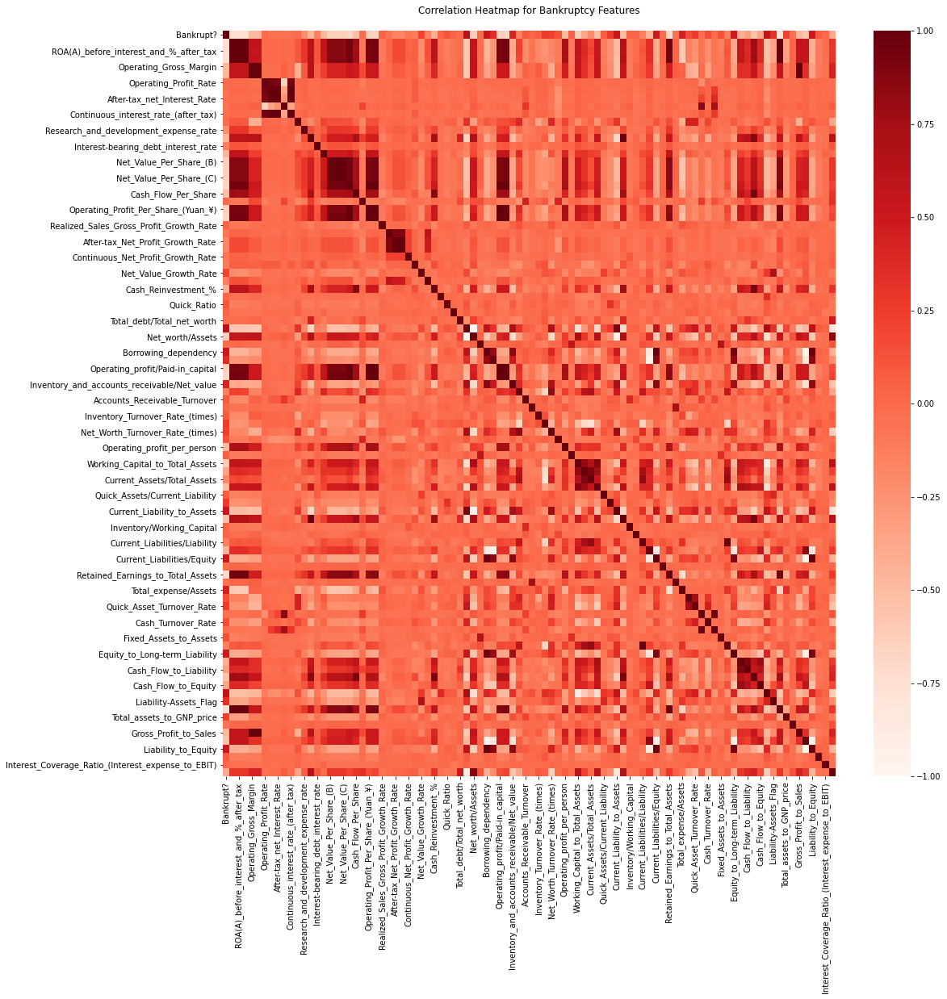

In [161]:
plt.figure(figsize=(17,17))
sns.heatmap(df_corr.corr(), annot=False, cmap='Reds')
plt.title('Correlation Heatmap for Bankruptcy Features\n')
plt.show()

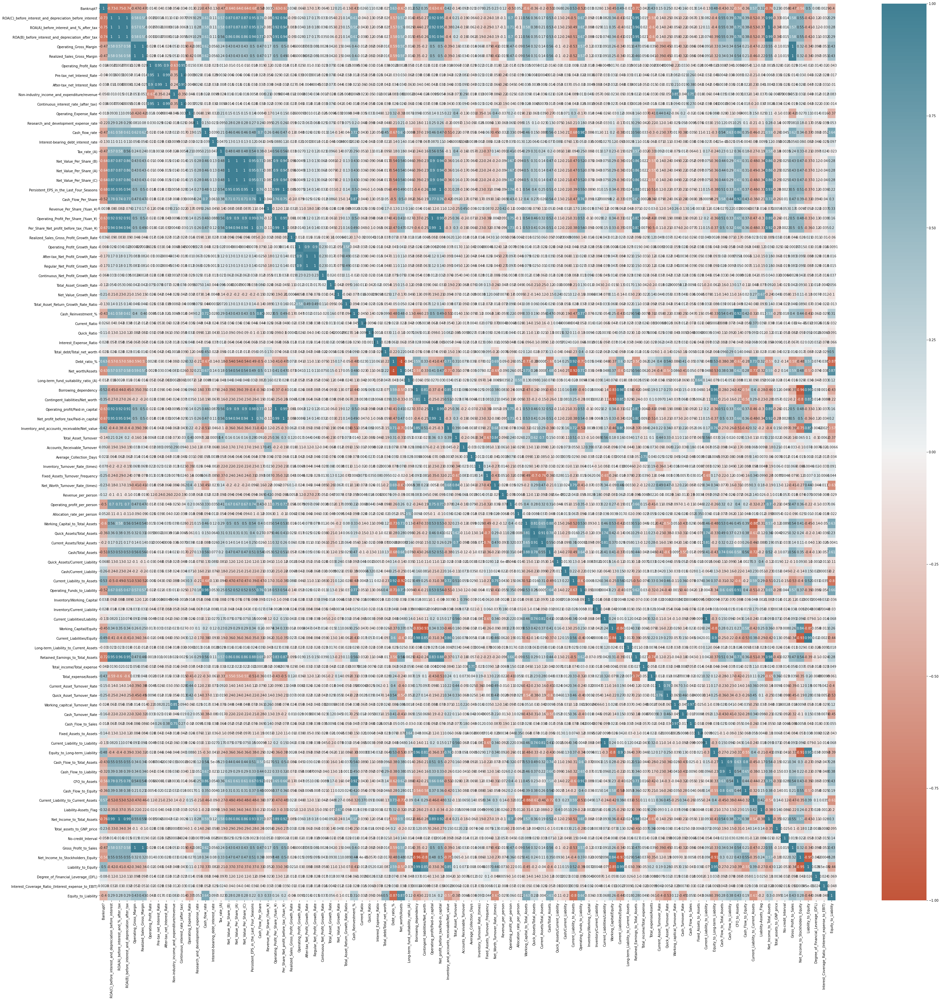

In [162]:
fig, ax = plt.subplots(figsize=(50,50))

sns.heatmap(df_corr.corr(), vmin=-1, vmax=1, cmap=sns.diverging_palette(20, 220, as_cmap=True), annot=True)

plt.show()

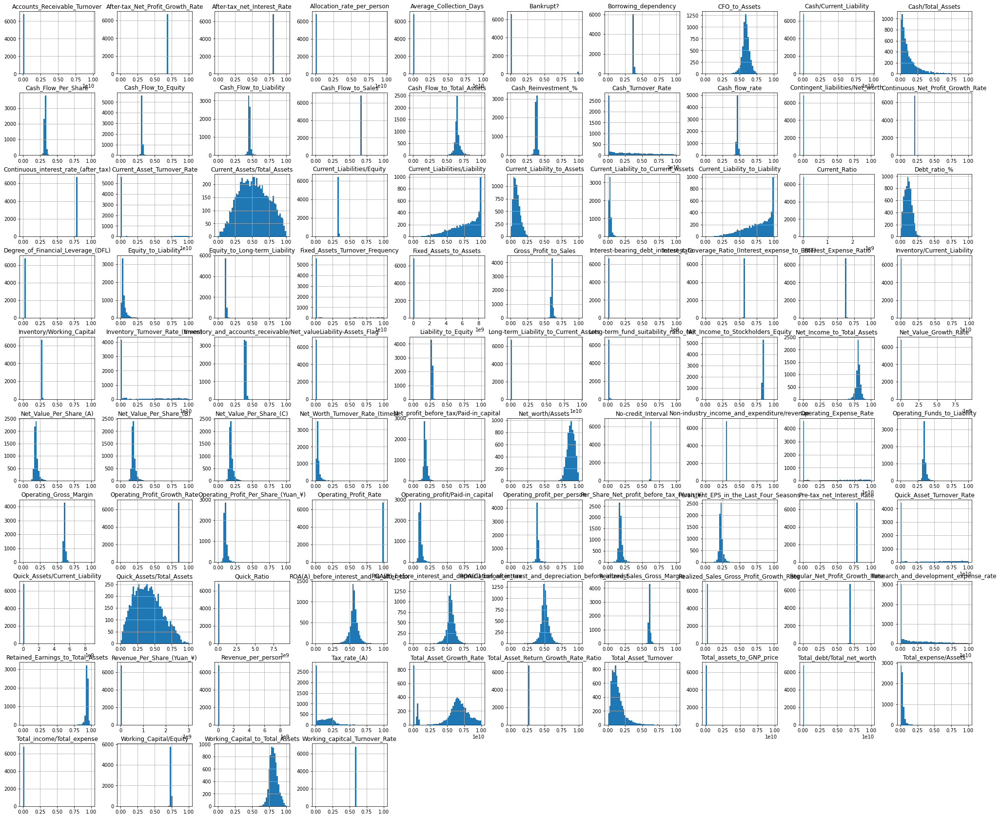

In [163]:
# look at histogram of numerical data
df.hist(figsize = (35,30), bins=50)
plt.show()

In [164]:
# split our feature matrix and target vector
y = df['Bankrupt?']
X = df.drop('Bankrupt?', axis=1)

# train-validation split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [165]:
# Find baseline accuracy using most common class for classification 
baseline_acc_train = y_train.value_counts(normalize=True).max()

print('Most common class <MODE> is:', round(baseline_acc_train*100,3),'%')
print('\nProbability of Continuing as Going Concern: ', round(baseline_acc_train*100,3),'%')
print('Probability of Business Bankruptcy', round(100-baseline_acc_train*100,3),'%')

Most common class <MODE> is: 96.902 %

Probability of Continuing as Going Concern:  96.902 %
Probability of Business Bankruptcy 3.098 %


**Build Initial Models for Baseline Metrics**

In [166]:
# Logistic Regression
model_log_reg = make_pipeline(OrdinalEncoder(),
                             SimpleImputer(),
                             LogisticRegression(random_state=42))
# Fit the model
model_log_reg.fit(X_train, y_train);

In [167]:
# Random Forest Classifier
model_rf = make_pipeline(OrdinalEncoder(),
                        SimpleImputer(),
                         RandomForestClassifier(random_state=42))
# Fit the model
model_rf.fit(X_train, y_train);

In [168]:
# GradientBoostingClassifier
model_skgb = make_pipeline(OrdinalEncoder(),
                          SimpleImputer(),
                          GradientBoostingClassifier(random_state=42))
# fit the model
model_skgb.fit(X_train, y_train);

In [169]:
# XGBoostClassifier
model_xgb = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(random_state=42, n_jobs=-1)
)

model_xgb.fit(X_train, y_train);

**Check Baseline Metrics for Selected Models on Training and Validation Sets**

In [170]:
# Check baseline metrics for selected models on training and validation sets
print('Logistic Regression Training Accuracy:', model_log_reg.score(X_train, y_train))
print('Logistic Regression Validation Accuracy:', model_log_reg.score(X_val, y_val))
print('\nRandomForestClassifier Training Accuracy:', model_rf.score(X_train, y_train))
print('RandomForestClassifier Validation Accuracy:', model_rf.score(X_val, y_val))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb.score(X_train, y_train))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb.score(X_val, y_val))
print('\nXGBoostClassifier Training Accuracy:', model_xgb.score(X_train, y_train))
print('XGBoostClassifier Validation Accuracy:', model_xgb.score(X_val, y_val))

Logistic Regression Training Accuracy: 0.9677360219981668
Logistic Regression Validation Accuracy: 0.9611436950146628

RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.968475073313783

GradientBoostingClassifier Training Accuracy: 0.9915673693858845
GradientBoostingClassifier Validation Accuracy: 0.967741935483871

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.968475073313783


**Scale Data and Compare Versus Baseline Accuracy Above**

In [171]:
print('Columns not scaled in data set\n')
# Scaling is important in algorithms such as support vector machines (SVM) 
# and k-nearest neighbors (KNN) where distance between the data points is important.

# Check to see which which columns are scaled/not scaled
count = 0
not_scaled = []
for col in df.columns:
    if max(df[col])>1:
        print('not scaled: ', col)
        count += 1
        not_scaled.append(col)
        
print('\nTotal columns not scaled in data set:', len(not_scaled), 'out of', df.shape[1] )

Columns not scaled in data set

not scaled:  Operating_Expense_Rate
not scaled:  Research_and_development_expense_rate
not scaled:  Interest-bearing_debt_interest_rate
not scaled:  Revenue_Per_Share_(Yuan_¥)
not scaled:  Total_Asset_Growth_Rate
not scaled:  Net_Value_Growth_Rate
not scaled:  Current_Ratio
not scaled:  Quick_Ratio
not scaled:  Total_debt/Total_net_worth
not scaled:  Accounts_Receivable_Turnover
not scaled:  Average_Collection_Days
not scaled:  Inventory_Turnover_Rate_(times)
not scaled:  Fixed_Assets_Turnover_Frequency
not scaled:  Revenue_per_person
not scaled:  Allocation_rate_per_person
not scaled:  Quick_Assets/Current_Liability
not scaled:  Cash/Current_Liability
not scaled:  Inventory/Current_Liability
not scaled:  Long-term_Liability_to_Current_Assets
not scaled:  Current_Asset_Turnover_Rate
not scaled:  Quick_Asset_Turnover_Rate
not scaled:  Cash_Turnover_Rate
not scaled:  Fixed_Assets_to_Assets
not scaled:  Total_assets_to_GNP_price

Total columns not scaled in

In [172]:
# Use MinMaxScaler to scale for SVM or KNN algos if necesarry
df_scaled = df.copy()
scaler = MinMaxScaler()
df_scaled[not_scaled] = scaler.fit_transform(df_scaled[not_scaled])

In [173]:
# split our feature matrix and target vector
y_scaled = df_scaled['Bankrupt?']
X_scaled = df_scaled.drop('Bankrupt?', axis=1)

# train-validation split
X_train_scaled, X_val_scaled, y_train_scaled, y_val_scaled = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

**Compare Accuracy of SCALED Models Versus Baseline Models** 

In [174]:
# Logistic Regression 
model_log_reg_scaled = make_pipeline(OrdinalEncoder(),
                                    SimpleImputer(),
                                    LogisticRegression(random_state=42))
# Fit the model
model_log_reg_scaled.fit(X_train_scaled, y_train_scaled);

In [175]:
# Random Forest Classifier SCALED
model_rf_scaled = make_pipeline(OrdinalEncoder(),
                        SimpleImputer(),
                         RandomForestClassifier(random_state=42))
# Fit the model
model_rf_scaled.fit(X_train_scaled, y_train_scaled);

In [176]:
# GradientBoostingClassifier SCALED
model_skgb_scaled = make_pipeline(OrdinalEncoder(),
                          SimpleImputer(),
                          GradientBoostingClassifier(random_state=42))
# fit the model
model_skgb_scaled.fit(X_train_scaled, y_train_scaled);

In [177]:
# XGBoostClassifier SCALED
model_xgb_scaled = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(random_state=42, n_jobs=-1)
)

model_xgb_scaled.fit(X_train_scaled, y_train_scaled);

In [178]:
# Check baseline metrics for selected models on training and validation sets
print('-------------------Not Scaled------------------------')
print('Logistic Regression Training Accuracy:', model_log_reg.score(X_train, y_train))
print('Logistic Regression Validation Accuracy:', model_log_reg.score(X_val, y_val))
print('\nRandomForestClassifier Training Accuracy:', model_rf.score(X_train, y_train))
print('RandomForestClassifier Validation Accuracy:', model_rf.score(X_val, y_val))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb.score(X_train, y_train))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb.score(X_val, y_val))
print('\nXGBoostClassifier Training Accuracy:', model_xgb.score(X_train, y_train))
print('XGBoostClassifier Validation Accuracy:', model_xgb.score(X_val, y_val))
#Check SCALED baseline metrics for selected models on training and validation sets
print('\n--------------------Scaled--------------------------')
print('Logistic Regression Training Accuracy:', model_log_reg_scaled.score(X_train_scaled, y_train_scaled))
print('Logistic Regression Validation Accuracy:', model_log_reg_scaled.score(X_val_scaled, y_val_scaled))
print('\nRandomForestClassifier Training Accuracy:', model_rf_scaled.score(X_train_scaled, y_train_scaled))
print('RandomForestClassifier Validation Accuracy:', model_rf_scaled.score(X_val_scaled, y_val_scaled))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb_scaled.score(X_train_scaled, y_train_scaled))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb_scaled.score(X_val_scaled, y_val_scaled))
print('\nXGBoostClassifier Training Accuracy:', model_xgb_scaled.score(X_train_scaled, y_train_scaled))
print('XGBoostClassifier Validation Accuracy:', model_xgb_scaled.score(X_val_scaled, y_val_scaled))

-------------------Not Scaled------------------------
Logistic Regression Training Accuracy: 0.9677360219981668
Logistic Regression Validation Accuracy: 0.9611436950146628

RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.968475073313783

GradientBoostingClassifier Training Accuracy: 0.9915673693858845
GradientBoostingClassifier Validation Accuracy: 0.967741935483871

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.968475073313783

--------------------Scaled--------------------------
Logistic Regression Training Accuracy: 0.9710357470210815
Logistic Regression Validation Accuracy: 0.966275659824047

RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.966275659824047

GradientBoostingClassifier Training Accuracy: 0.9917506874427131
GradientBoostingClassifier Validation Accuracy: 0.9648093841642229

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accu

In [179]:
# Variation of baselines:
print('Variation RandomForestClassifier (Training Set) Scaled/Not Scaled:', 
      model_rf_scaled.score(X_train_scaled, y_train_scaled)-model_rf.score(X_train, y_train))
print('Variation RandomForestClassifier (Validation Set) Scaled/Not Scaled:', 
      model_rf_scaled.score(X_val_scaled, y_val_scaled)-model_rf.score(X_val, y_val))
print('\nVariation GradientBoostingClassifier (Training Set) Scaled/Not Scaled:', 
      model_skgb_scaled.score(X_train_scaled, y_train_scaled)-model_skgb.score(X_train, y_train))
print('Variation GradientBoostingClassifier (Validation Set) Scaled/Not Scaled:', 
      model_skgb_scaled.score(X_val_scaled, y_val_scaled)-model_skgb.score(X_val, y_val))
print('\nVariation XGBoostClassifier (Training Set) Scaled/Not Scaled:', 
      model_xgb_scaled.score(X_train_scaled, y_train_scaled)-model_xgb.score(X_train, y_train))
print('Variation XGBoostClassifier (Validation Set) Scaled/Not Scaled:', 
      model_xgb_scaled.score(X_val_scaled, y_val_scaled)-model_xgb.score(X_val, y_val))

Variation RandomForestClassifier (Training Set) Scaled/Not Scaled: 0.0
Variation RandomForestClassifier (Validation Set) Scaled/Not Scaled: -0.0021994134897360684

Variation GradientBoostingClassifier (Training Set) Scaled/Not Scaled: 0.00018331805682858526
Variation GradientBoostingClassifier (Validation Set) Scaled/Not Scaled: -0.0029325513196480912

Variation XGBoostClassifier (Training Set) Scaled/Not Scaled: 0.0
Variation XGBoostClassifier (Validation Set) Scaled/Not Scaled: 0.0


**Check for Skewed Variables in the Data Set**

In [180]:
# Use pandas .skew method to calculate Fisher-Pearson standardized
# moment coefficient for all columns in DataFrame
# determine index for continuous variables
num_feats = df.dtypes[df.dtypes!='object'].index
# calculate skew and sort
skew_feats = df[num_feats].skew().sort_values(ascending=False)
skewness=pd.DataFrame({'Skew':skew_feats})
skewness= np.array

In [181]:
skew_feats

Current_Ratio                                              82.577237
Fixed_Assets_to_Assets                                     82.577237
Total_income/Total_expense                                 82.332424
Net_Value_Growth_Rate                                      80.291844
Contingent_liabilities/Net_worth                           79.670620
Realized_Sales_Gross_Profit_Growth_Rate                    77.925109
Continuous_Net_Profit_Growth_Rate                          67.097534
Total_Asset_Return_Growth_Rate_Ratio                       62.499961
Revenue_per_person                                         59.434480
Quick_Assets/Current_Liability                             47.947300
Total_debt/Total_net_worth                                 46.355336
Degree_of_Financial_Leverage_(DFL)                         45.724197
Inventory/Working_Capital                                  45.332250
Revenue_Per_Share_(Yuan_¥)                                 43.769098
Non-industry_income_and_expenditur

**Normalize Skewed information using Log Transformation**

In [182]:
# Log transformation using For Loop for data Normalization
df_log = df.copy()
target = df_log['Bankrupt?']
df_log = df_log.drop(['Bankrupt?'], axis = 1)

def log_trans(df_log):
    
    for col in df_log:
        skew = df_log[col].skew()
        if skew > 0.5 or skew < -0.5:
            df_log[col] = np.log1p(df_log[col])
        else:
            continue
            
    return df_log

data_norm = log_trans(df_log)

In [183]:
# Use pandas .skew method to calculate Fisher-Pearson standardized
# moment coefficient for all columns in DataFrame
# determine index for continuous variables
num_feats = df_log.dtypes[df_log.dtypes!='object'].index
# calculate skew and sort
skew_feats_log = df_log[num_feats].skew().sort_values(ascending=False)
skewness_log =pd.DataFrame({'Skew':skew_feats})
skewness_log = np.array

In [184]:
skew_feats_log

Total_income/Total_expense                                 82.076512
Current_Ratio                                              81.908514
Contingent_liabilities/Net_worth                           77.039435
Realized_Sales_Gross_Profit_Growth_Rate                    74.048079
Net_Value_Growth_Rate                                      58.502201
Revenue_per_person                                         57.096289
Fixed_Assets_to_Assets                                     55.138570
Continuous_Net_Profit_Growth_Rate                          54.740412
Quick_Assets/Current_Liability                             47.577819
Total_Asset_Return_Growth_Rate_Ratio                       47.298766
Degree_of_Financial_Leverage_(DFL)                         39.844278
Revenue_Per_Share_(Yuan_¥)                                 36.650661
Total_debt/Total_net_worth                                 29.227458
Liability-Assets_Flag                                      29.150472
Inventory/Working_Capital         

In [185]:
df_log.profile_report(minimal = True)

Summarize dataset:   0%|          | 0/101 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Baseline Metrics with Log Transformed Data**

In [186]:
# split our feature matrix and target vector
y_log = target
X_log = df_log

# train-validation split
X_train_log, X_val_log, y_train_log, y_val_log = train_test_split(X_log, y_log, test_size=0.2, random_state=42)

In [187]:
# Find baseline accuracy using most common class for classification 
baseline_acc_log = y_train_log.value_counts(normalize=True).max()

print('Most common class <MODE> is:', round(baseline_acc_log*100,3),'%')
print('\nProbability of Continuing as Going Concern: ', round(baseline_acc_log*100,3),'%')
print('Probability of Business Bankruptcy', round(100-baseline_acc_log*100,3),'%')

Most common class <MODE> is: 96.902 %

Probability of Continuing as Going Concern:  96.902 %
Probability of Business Bankruptcy 3.098 %


**Build Models using Log Transformed Data**

In [188]:
# Random Forest Classifier with Log Transformed Data
model_rf_log = make_pipeline(OrdinalEncoder(),
                        SimpleImputer(),
                         RandomForestClassifier(random_state=42))
# Fit the model
model_rf_log.fit(X_train_log, y_train_log);

In [189]:
# GradientBoostingClassifier with Log Transformed Data
model_skgb_log = make_pipeline(OrdinalEncoder(),
                          SimpleImputer(),
                          GradientBoostingClassifier(random_state=42))
# fit the model
model_skgb_log.fit(X_train_log, y_train_log);

In [190]:
# XGBoostClassifier with Log Transformed Data
model_xgb_log = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(random_state=42, n_jobs=-1)
)

model_xgb_log.fit(X_train_log, y_train_log);

In [191]:
# Check baseline metrics for selected models on training and validation sets
print('-------------------Baseline Accuracy------------------------')
print('RandomForestClassifier Training Accuracy:', model_rf.score(X_train, y_train))
print('RandomForestClassifier Validation Accuracy:', model_rf.score(X_val, y_val))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb.score(X_train, y_train))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb.score(X_val, y_val))
print('\nXGBoostClassifier Training Accuracy:', model_xgb.score(X_train, y_train))
print('XGBoostClassifier Validation Accuracy:', model_xgb.score(X_val, y_val))
#Check Log Transfored Data baseline metrics for selected models on training and validation sets
print('\n-------------Baseline Log Transformed Data----------------')
print('\nRandomForestClassifier Training Accuracy:', model_rf_log.score(X_train_log, y_train_log))
print('RandomForestClassifier Validation Accuracy:', model_rf_log.score(X_val_log, y_val_log))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb_log.score(X_train_log, y_train_log))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb_log.score(X_val_log, y_val_log))
print('\nXGBoostClassifier Training Accuracy:', model_xgb_log.score(X_train_log, y_train_log))
print('XGBoostClassifier Validation Accuracy:', model_xgb_log.score(X_val_log, y_val_log))

-------------------Baseline Accuracy------------------------
RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.968475073313783

GradientBoostingClassifier Training Accuracy: 0.9915673693858845
GradientBoostingClassifier Validation Accuracy: 0.967741935483871

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.968475073313783

-------------Baseline Log Transformed Data----------------

RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.969208211143695

GradientBoostingClassifier Training Accuracy: 0.9923006416131989
GradientBoostingClassifier Validation Accuracy: 0.967741935483871

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.967741935483871


In [192]:
# Variation of baselines:
print('Variation RandomForest Training Set: Log Transformed/Not Log Transformed:', 
      model_rf_log.score(X_train_log, y_train_log)-model_rf.score(X_train, y_train))
print('Variation RandomForest Validation Set: Log Transformed/Not Log Transformed:', 
      model_rf_log.score(X_val_log, y_val_log)-model_rf.score(X_val, y_val))
print('\nVariation GradientBoosting Training Set: Log Transformed/Not Log Transformed:', 
      model_skgb_log.score(X_train_log, y_train_log)-model_skgb.score(X_train, y_train))
print('Variation GradientBoosting Validation Set: Log Transformed/Not Log Transformed:', 
      model_skgb_log.score(X_val_log, y_val_log)-model_skgb.score(X_val, y_val))
print('\nVariation XGBoost Training Set: Log Transformed/Not Log Transformed:', 
      model_xgb_log.score(X_train_log, y_train_log)-model_xgb.score(X_train, y_train))
print('Variation XGBoost Validation Set: Log Transformed/Not Log Transformed:', 
      model_xgb_log.score(X_val_log, y_val_log)-model_xgb.score(X_val, y_val))

Variation RandomForest Training Set: Log Transformed/Not Log Transformed: 0.0
Variation RandomForest Validation Set: Log Transformed/Not Log Transformed: 0.0007331378299120228

Variation GradientBoosting Training Set: Log Transformed/Not Log Transformed: 0.000733272227314341
Variation GradientBoosting Validation Set: Log Transformed/Not Log Transformed: 0.0

Variation XGBoost Training Set: Log Transformed/Not Log Transformed: 0.0
Variation XGBoost Validation Set: Log Transformed/Not Log Transformed: -0.0007331378299120228


**Feature Importance for Baseline Models**

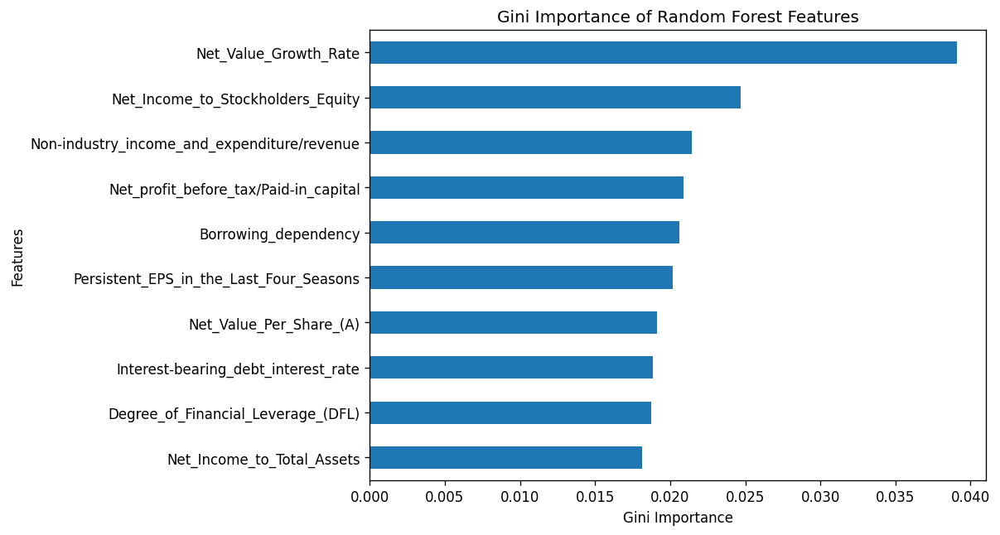

In [193]:
# RandomForestClassifier Horizontal Bar Chart of Feature Importances
features = list(X_train.columns)
gini = model_rf.named_steps['randomforestclassifier'].feature_importances_

plt.figure(figsize=(8,6), dpi=120)
pd.Series(data=gini, index=features).sort_values(ascending=True).tail(10).plot(kind='barh')
plt.title('Gini Importance of Random Forest Features')
plt.xlabel('Gini Importance')
plt.ylabel('Features')

plt.show()

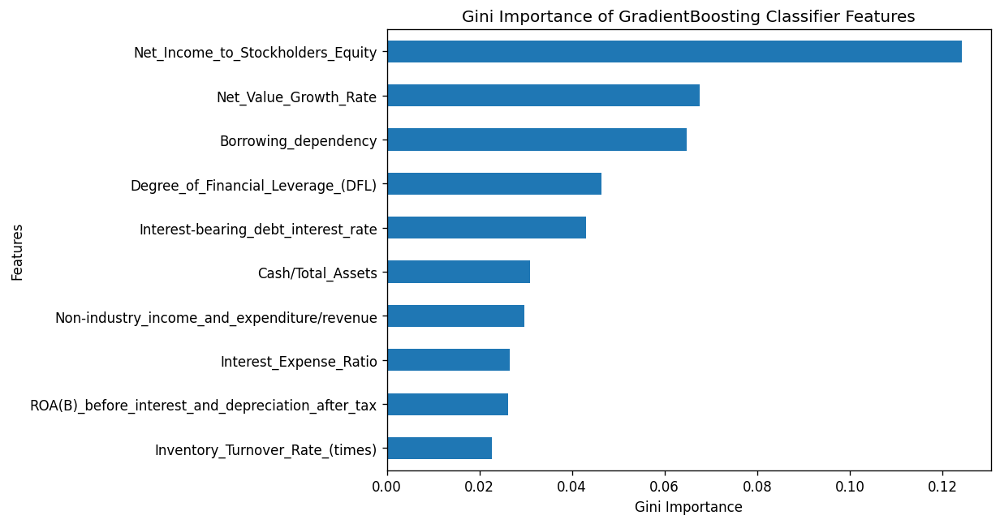

In [194]:
# GradientBoosting Classifier Horizontal Bar Chart of Feature Importances
features = list(X_train.columns)
gini = model_skgb.named_steps['gradientboostingclassifier'].feature_importances_

plt.figure(figsize=(8,6), dpi=120)
pd.Series(data=gini, index=features).sort_values(ascending=True).tail(10).plot(kind='barh')
plt.title('Gini Importance of GradientBoosting Classifier Features')
plt.xlabel('Gini Importance')
plt.ylabel('Features')

plt.show()

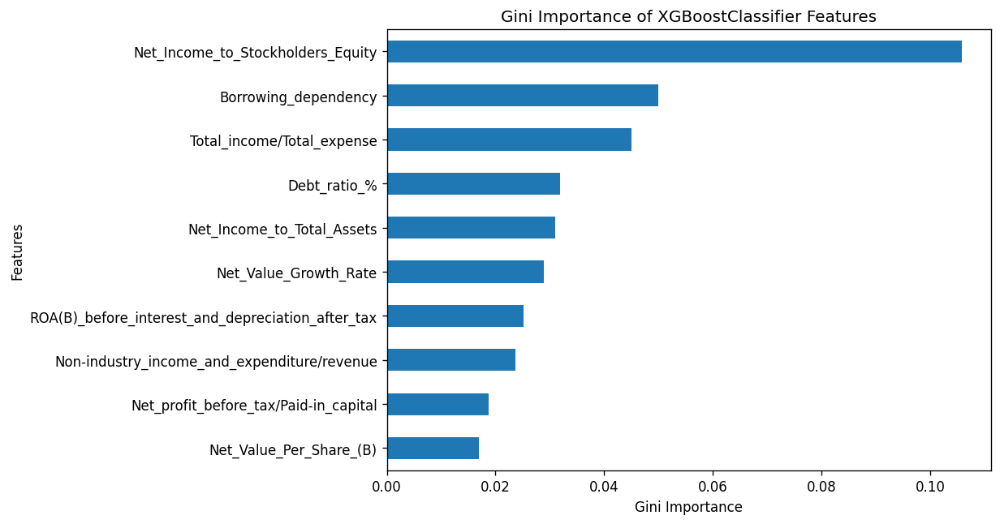

In [195]:
# XGBoostClassifier Horizontal Bar Chart of Feature Importances
features = list(X_train.columns)
gini = model_xgb.named_steps['xgbclassifier'].feature_importances_

plt.figure(figsize=(8,6), dpi=120)
pd.Series(data=gini, index=features).sort_values(ascending=True).tail(10).plot(kind='barh')
plt.title('Gini Importance of XGBoostClassifier Features')
plt.xlabel('Gini Importance')
plt.ylabel('Features')

plt.show()

**Permutation Importance for Baseline Models**

In [196]:
# Permutation Importance for XGBoostClassifier
perm_imp = permutation_importance(model_xgb, 
                                  X_val, 
                                  y_val, 
                                  n_repeats=5, 
                                  n_jobs=-1, 
                                  random_state=42)


data = {'imp_mean': perm_imp['importances_mean'],
       'imp_std': perm_imp['importances_std']}
importances = pd.DataFrame(data, index=X_val.columns).sort_values(by='imp_mean')
importances.head()

,imp_mean,imp_std
Net_Value_Growth_Rate,-0.002933,0.000464
Total_Asset_Return_Growth_Rate_Ratio,-0.001466,0.000000
Realized_Sales_Gross_Profit_Growth_Rate,-0.001026,0.000359
Operating_Profit_Growth_Rate,-0.001026,0.000359
Operating_Profit_Per_Share_(Yuan_¥),-0.000880,0.000855


<function matplotlib.pyplot.show(close=None, block=None)>

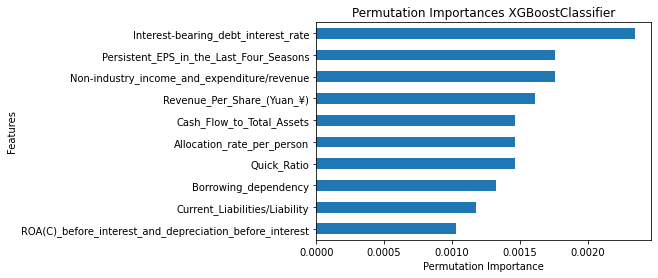

In [197]:
importances['imp_mean'].tail(10).plot(kind='barh')
plt.title('Permutation Importances XGBoostClassifier')
plt.xlabel('Permutation Importance')
plt.ylabel('Features')


plt.show

**Sort Features by Variance. Remove low variance features.**

In [198]:
# Sort features by Variance

df_mean = np.mean(df, axis=0)
variance = np.var(df/df_mean, axis=0)
df_low_var = pd.DataFrame(variance,columns=['variance'])
df_low_var.sort_values(by='variance').style.background_gradient(sns.light_palette('red', as_cmap=True))

,variance
Operating_Profit_Growth_Rate,0.000161
Operating_Profit_Rate,0.000170
Cash_Flow_to_Sales,0.000193
Working_capitcal_Turnover_Rate,0.000227
Working_Capital/Equity,0.000252
Pre-tax_net_Interest_Rate,0.000261
Continuous_interest_rate_(after_tax),0.000263
After-tax_net_Interest_Rate,0.000283
Net_Income_to_Stockholders_Equity,0.000299
Interest_Expense_Ratio,0.000317


In [199]:
# set Variance Threshold 
vt = VarianceThreshold(5.0).fit(df/df_mean)

vt_transform = vt.transform(df/df_mean)

In [200]:
# segment between low and high variance columns
high_var_cols = df.columns[vt.get_support()]
low_var_cols = df.columns[~vt.get_support()]

print("Removed cols :",len(low_var_cols))
print("Remaining cols :",len(high_var_cols))

Removed cols : 72
Remaining cols : 22


In [201]:
# Remove low variance columns and set up df_var DataFrame with remaining High Variance Columns
df_var = df.copy()
df_var.drop(columns=['ROA(C)_before_interest_and_depreciation_before_interest', 
                              'ROA(A)_before_interest_and_%_after_tax', 'ROA(B)_before_interest_and_depreciation_after_tax', 
                              'Operating_Gross_Margin', 'Realized_Sales_Gross_Margin', 'Operating_Profit_Rate', 
                              'Pre-tax_net_Interest_Rate', 'After-tax_net_Interest_Rate', 
                              'Non-industry_income_and_expenditure/revenue', 'Continuous_interest_rate_(after_tax)', 
                              'Operating_Expense_Rate', 'Research_and_development_expense_rate', 'Cash_flow_rate', 
                              'Tax_rate_(A)', 'Net_Value_Per_Share_(B)', 'Net_Value_Per_Share_(A)', 'Net_Value_Per_Share_(C)',
                              'Persistent_EPS_in_the_Last_Four_Seasons', 'Cash_Flow_Per_Share', 
                              'Operating_Profit_Per_Share_(Yuan_¥)', 'Per_Share_Net_profit_before_tax_(Yuan_¥)', 
                              'Realized_Sales_Gross_Profit_Growth_Rate', 'Operating_Profit_Growth_Rate', 
                              'After-tax_Net_Profit_Growth_Rate', 'Regular_Net_Profit_Growth_Rate', 
                              'Continuous_Net_Profit_Growth_Rate', 'Total_Asset_Growth_Rate', 'Total_Asset_Return_Growth_Rate_Ratio', 
                              'Cash_Reinvestment_%','Interest_Expense_Ratio', 'Debt_ratio_%', 'Net_worth/Assets', 
                              'Borrowing_dependency', 'Contingent_liabilities/Net_worth', 'Operating_profit/Paid-in_capital', 
                              'Net_profit_before_tax/Paid-in_capital', 'Inventory_and_accounts_receivable/Net_value', 
                              'Total_Asset_Turnover', 'Inventory_Turnover_Rate_(times)', 'Net_Worth_Turnover_Rate_(times)', 
                              'Operating_profit_per_person', 'Working_Capital_to_Total_Assets', 'Quick_Assets/Total_Assets', 
                              'Current_Assets/Total_Assets', 'Cash/Total_Assets', 'Current_Liability_to_Assets', 
                              'Operating_Funds_to_Liability', 'Inventory/Working_Capital', 'Current_Liabilities/Liability', 
                              'Working_Capital/Equity', 'Current_Liabilities/Equity', 'Retained_Earnings_to_Total_Assets', 
                              'Total_expense/Assets', 'Quick_Asset_Turnover_Rate', 'Working_capitcal_Turnover_Rate', 
                              'Cash_Turnover_Rate', 'Cash_Flow_to_Sales', 'Current_Liability_to_Liability', 
                              'Equity_to_Long-term_Liability', 'Cash_Flow_to_Total_Assets', 'Cash_Flow_to_Liability', 
                              'CFO_to_Assets','Cash_Flow_to_Equity', 'Current_Liability_to_Current_Assets', 
                              'Net_Income_to_Total_Assets', 'No-credit_Interval', 'Gross_Profit_to_Sales', 
                              'Net_Income_to_Stockholders_Equity', 'Liability_to_Equity', 'Degree_of_Financial_Leverage_(DFL)',
                              'Interest_Coverage_Ratio_(Interest_expense_to_EBIT)', 'Equity_to_Liability'], inplace=True)

df_var = df_var.reset_index(drop=True)
df_var.shape

(6819, 22)

In [202]:
df_var.head()

,Bankrupt?,Interest-bearing_debt_interest_rate,Revenue_Per_Share_(Yuan_¥),Net_Value_Growth_Rate,Current_Ratio,Quick_Ratio,Total_debt/Total_net_worth,Long-term_fund_suitability_ratio_(A),Accounts_Receivable_Turnover,Average_Collection_Days,Fixed_Assets_Turnover_Frequency,Revenue_per_person,Allocation_rate_per_person,Quick_Assets/Current_Liability,Cash/Current_Liability,Inventory/Current_Liability,Long-term_Liability_to_Current_Assets,Total_income/Total_expense,Current_Asset_Turnover_Rate,Fixed_Assets_to_Assets,Liability-Assets_Flag,Total_assets_to_GNP_price
0,1,0.000725,0.017560,0.000327,0.002259,0.001208,0.021266,0.005024,0.001814,0.003487,1.165007e-04,0.034164,0.037135,0.001997,1.473360e-04,0.001036,0.025592,0.002022,7.010000e+08,0.424206,0,0.009219
1,1,0.000647,0.021144,0.000443,0.006016,0.004039,0.012502,0.005059,0.001286,0.004917,7.190000e+08,0.006889,0.012335,0.004136,1.383910e-03,0.005210,0.023947,0.002226,1.065198e-04,0.468828,0,0.008323
2,1,0.000790,0.005944,0.000396,0.011543,0.005348,0.021248,0.005100,0.001495,0.004227,2.650000e+09,0.028997,0.141016,0.006302,5.340000e+09,0.013879,0.003715,0.002060,1.791094e-03,0.276179,0,0.040003
3,1,0.000449,0.014368,0.000382,0.004194,0.002896,0.009572,0.005047,0.001966,0.003215,9.150000e+09,0.015463,0.021320,0.002961,1.010646e-03,0.003540,0.022165,0.001831,8.140000e+09,0.559144,0,0.003252
4,1,0.000686,0.029690,0.000439,0.006022,0.003727,0.005150,0.005303,0.001449,0.004367,2.935211e-04,0.058111,0.023988,0.004275,6.804636e-04,0.004869,0.000000,0.002224,6.680000e+09,0.309555,0,0.003878


**Split DataSet & Get Baseline Accuracy for Low Variance Features**

In [203]:
# split our feature matrix and target vector
target_var = df_var['Bankrupt?']
y_var = target_var
X_var = df_var.drop(['Bankrupt?'], axis=1)


#features_var = list(X_train_var.columns)# used further down but needs to run after train val split

#for train_index, val_index in train_test_split(X):
 #   X_train_var, X_val_var = x.iloc[train_index], x.iloc[val_index]
  #  y_train_var, y_val_var = y.iloc[train_index], y.iloc[val_index]
    

# train-validation split
X_train_var, X_val_var, y_train_var, y_val_var = train_test_split(X_var, y_var, test_size=0.2, random_state=42)

In [204]:
# Find baseline accuracy using most common class for classification 
baseline_acc_var = y_train_var.value_counts(normalize=True).max()

print('Most common class <MODE> is:', round(baseline_acc_var*100,3),'%')
print('\nProbability of Continuing as Going Concern: ', round(baseline_acc_var*100,3),'%')
print('Probability of Business Bankruptcy', round(100-baseline_acc_var*100,3),'%')

Most common class <MODE> is: 96.902 %

Probability of Continuing as Going Concern:  96.902 %
Probability of Business Bankruptcy 3.098 %


**Build Models & get Baseline Model Accuracy using Low Variance Features**

In [205]:
# RandomForestClassifier using low variance features
model_rf_var = make_pipeline(OrdinalEncoder(),
                         SimpleImputer(),
                         RandomForestClassifier(random_state=42))
# fit the model 
model_rf_var.fit(X_train_var, y_train_var);

In [206]:
# GradientBoostingClassifier using low variance features
model_skgb_var = make_pipeline(OrdinalEncoder(),
                          SimpleImputer(),
                          GradientBoostingClassifier(random_state=42))
# fit the model
model_skgb_var.fit(X_train_var, y_train_var);

In [207]:
# XGBoostClassifier using low variance features
model_xgb_var = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    XGBClassifier(random_state=42, n_jobs=-1)
)

model_xgb_var.fit(X_train_var, y_train_var);

In [208]:
# Check baseline metrics for selected models on training and validation sets
print('-------------------Baseline Accuracy------------------------')
print('RandomForestClassifier Training Accuracy:', model_rf.score(X_train, y_train))
print('RandomForestClassifier Validation Accuracy:', model_rf.score(X_val, y_val))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb.score(X_train, y_train))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb.score(X_val, y_val))
print('\nXGBoostClassifier Training Accuracy:', model_xgb.score(X_train, y_train))
print('XGBoostClassifier Validation Accuracy:', model_xgb.score(X_val, y_val))
#Check lwo variance Data baseline metrics for selected models on training and validation sets
print('\n-------------Baseline Log Transformed Data----------------')
print('\nRandomForestClassifier Training Accuracy:', model_rf_var.score(X_train_var, y_train_var))
print('RandomForestClassifier Validation Accuracy:', model_rf_var.score(X_val_var, y_val_var))
print('\nGradientBoostingClassifier Training Accuracy:', model_skgb_var.score(X_train_var, y_train_var))
print('GradientBoostingClassifier Validation Accuracy:', model_skgb_var.score(X_val_var, y_val_var))
print('\nXGBoostClassifier Training Accuracy:', model_xgb_var.score(X_train_var, y_train_var))
print('XGBoostClassifier Validation Accuracy:', model_xgb_var.score(X_val_var, y_val_var))

-------------------Baseline Accuracy------------------------
RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.968475073313783

GradientBoostingClassifier Training Accuracy: 0.9915673693858845
GradientBoostingClassifier Validation Accuracy: 0.967741935483871

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.968475073313783

-------------Baseline Log Transformed Data----------------

RandomForestClassifier Training Accuracy: 1.0
RandomForestClassifier Validation Accuracy: 0.969208211143695

GradientBoostingClassifier Training Accuracy: 0.9890009165902841
GradientBoostingClassifier Validation Accuracy: 0.9640762463343109

XGBoostClassifier Training Accuracy: 1.0
XGBoostClassifier Validation Accuracy: 0.967741935483871


In [209]:
# Variation of baselines:
print('Variation RandomForest Training Set: Low Variance Features vs. Baseline data:', 
      model_rf_var.score(X_train_var, y_train_var)-model_rf.score(X_train, y_train))
print('Variation RandomForest Validation Set: Low Variance Features vs. Baseline data:', 
      model_rf_var.score(X_val_var, y_val_var)-model_rf.score(X_val, y_val))
print('\nVariation GradientBoosting Training Set: Low Variance Features vs. Baseline data:', 
      model_skgb_var.score(X_train_var, y_train_var)-model_skgb.score(X_train, y_train))
print('Variation GradientBoosting Validation Set: Low Variance Features vs. Baseline data:', 
      model_skgb_var.score(X_val_var, y_val_var)-model_skgb.score(X_val, y_val))
print('\nVariation XGBoost Training Set: Low Variance Features vs. Baseline data:', 
      model_xgb_var.score(X_train_var, y_train_var)-model_xgb.score(X_train, y_train))
print('Variation XGBoost Validation Set: Low Variance Features vs. Baseline data:', 
      model_xgb_var.score(X_val_var, y_val_var)-model_xgb.score(X_val, y_val))

Variation RandomForest Training Set: Low Variance Features vs. Baseline data: 0.0
Variation RandomForest Validation Set: Low Variance Features vs. Baseline data: 0.0007331378299120228

Variation GradientBoosting Training Set: Low Variance Features vs. Baseline data: -0.0025664527956004157
Variation GradientBoosting Validation Set: Low Variance Features vs. Baseline data: -0.003665689149560114

Variation XGBoost Training Set: Low Variance Features vs. Baseline data: 0.0
Variation XGBoost Validation Set: Low Variance Features vs. Baseline data: -0.0007331378299120228


**Use SMOTE to balance the Minority Class- RandomForestClassifier**

In [210]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# RandomForestClassifier
sm = SMOTE(random_state=42)

pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                               ['classifier', RandomForestClassifier(random_state=42)]])

stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

param_grid = {'classifier__n_estimators':[100,200]}

grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)

model_sm = grid_search.fit(X_train_var, y_train_var)
score = model_sm.best_score_
y_pred = model_sm.predict(X_val_var)
val_score = model_sm.score(X_val_var, y_val_var)

In [211]:
print('Classification report: RandomForestClassifier with Synthetic Minority Oversampling Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best F1 score: {score}\nValidation F1 score: {val_score}')

Classification report: RandomForestClassifier with Synthetic Minority Oversampling Technique

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1313
           1       0.35      0.51      0.42        51

    accuracy                           0.95      1364
   macro avg       0.67      0.74      0.69      1364
weighted avg       0.96      0.95      0.95      1364

Best F1 score: 0.4060162252545669
Validation F1 score: 0.41600000000000004


**Permutation Importance: RandomForestClassifier with Synthetic Minority Oversampling Technique**

In [212]:
# Calculate and Show Permutation Importance using eli5 library
perm = PermutationImportance(model_sm, random_state=42).fit(X_train_var, y_train_var)
eli5.show_weights(perm, feature_names=X_train_var.columns.tolist())

Weight,Feature
0.4963 ± 0.0628,Total_income/Total_expense
0.4530 ± 0.0511,Total_debt/Total_net_worth
0.1887 ± 0.0085,Net_Value_Growth_Rate
0.1713 ± 0.0309,Interest-bearing_debt_interest_rate
0.0890 ± 0.0131,Long-term_Liability_to_Current_Assets
0.0849 ± 0.0071,Quick_Ratio
0.0495 ± 0.0072,Current_Asset_Turnover_Rate
0.0459 ± 0.0183,Revenue_per_person
0.0441 ± 0.0128,Revenue_Per_Share_(Yuan_¥)
0.0378 ± 0.0055,Fixed_Assets_Turnover_Frequency


**Use SMOTE to balance the Minority Class- XGBClassifier**

In [213]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier 
sm = SMOTE(random_state=42)

pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                               ['classifier', XGBClassifier(random_state=42)]])

stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

param_grid = {'classifier__n_estimators':[100,200]}

grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='f1',
                          cv=stratified_kfold,
                          n_jobs=-1)

model_xgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_xgb_sm.best_score_
y_pred = model_xgb_sm.predict(X_val_var)
val_score = model_xgb_sm.score(X_val_var, y_val_var)

In [214]:
print('Classification report: XGBClassifier with Synthetic Minority Oversampling Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best F1 score: {score}\nValidation F1 score: {val_score}')

Classification report: XGBClassifier with Synthetic Minority Oversampling Technique

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1313
           1       0.34      0.49      0.40        51

    accuracy                           0.95      1364
   macro avg       0.66      0.73      0.69      1364
weighted avg       0.96      0.95      0.95      1364

Best F1 score: 0.3871920943078415
Validation F1 score: 0.40322580645161293


In [215]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier 
sm = SMOTE(random_state=42)

pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                               ['classifier', XGBClassifier(random_state=42)]])

stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

param_grid = {'classifier__n_estimators':[100,200]}

grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=stratified_kfold,
                          n_jobs=-1)

model_xgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_xgb_sm.best_score_
y_pred = model_xgb_sm.predict(X_val_var)
val_score = model_xgb_sm.score(X_val_var, y_val_var)

In [216]:
print('Classification report: XGBClassifier with Synthetic Minority Oversampling Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best ROC-AUC score: {score}\nValidation ROC-AUC score: {val_score}')

Classification report: XGBClassifier with Synthetic Minority Oversampling Technique

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1313
           1       0.34      0.49      0.40        51

    accuracy                           0.95      1364
   macro avg       0.66      0.73      0.69      1364
weighted avg       0.96      0.95      0.95      1364

Best ROC-AUC score: 0.9223813885830733
Validation ROC-AUC score: 0.9343518062213461


**Permutation Importance: XGBClassifier with Synthetic Minority Oversampling Technique**

In [217]:
# Calculate and Show Permutation Importance using eli5 library
perm = PermutationImportance(model_xgb_sm, random_state=42).fit(X_train_var, y_train_var)
eli5.show_weights(perm, feature_names=X_train_var.columns.tolist())

Weight,Feature
0.0214 ± 0.0032,Total_debt/Total_net_worth
0.0210 ± 0.0048,Total_income/Total_expense
0.0031 ± 0.0007,Interest-bearing_debt_interest_rate
0.0020 ± 0.0003,Average_Collection_Days
0.0013 ± 0.0002,Net_Value_Growth_Rate
0.0009 ± 0.0004,Accounts_Receivable_Turnover
0.0007 ± 0.0003,Revenue_Per_Share_(Yuan_¥)
0.0006 ± 0.0007,Allocation_rate_per_person
0.0004 ± 0.0002,Revenue_per_person
0.0003 ± 0.0001,Long-term_Liability_to_Current_Assets


In [218]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# SMOTE strategy with both over and undersampling
over = SMOTE(sampling_strategy=0.1, random_state=42)
under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
classifier = XGBClassifier(random_state=42)

# establish steps for pipeline
steps= [('over', over), ('under', under), ('classifier', classifier)]
pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

param_grid = {'classifier__n_estimators':[100,200]}

grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_xgb_sm.best_score_
y_pred = model_xgb_sm.predict(X_val_var)
val_score = model_xgb_sm.score(X_val_var, y_val_var)

In [219]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best ROC_AUC score : {score}\nValidation ROC_AUC score: {val_score}')

Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1313
           1       0.35      0.75      0.47        51

    accuracy                           0.94      1364
   macro avg       0.67      0.85      0.72      1364
weighted avg       0.97      0.94      0.95      1364

Best ROC_AUC score : 0.936824025308124
Validation ROC_AUC score: 0.9468960470707705


In [220]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# SMOTE strategy with both over and undersampling
k_values = [1,2,3,4,5,6,7,8,9,10]
for k in k_values:
    
    over = SMOTE(sampling_strategy=0.1, random_state=42, k_neighbors=k)
    under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
    classifier = XGBClassifier(random_state=42)

# establish steps for pipeline
    steps= [('over', over), ('under', under), ('classifier', classifier)]
    pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
    stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

    repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

    param_grid = {'classifier__n_estimators':[100,200]}

    grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_xgb_sm.best_score_
y_pred = model_xgb_sm.predict(X_val_var)
val_score = model_xgb_sm.score(X_val_var, y_val_var)

In [221]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best ROC_AUC score : {score}\nValidation ROC_AUC score: {val_score}')


Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.94      0.96      1313
           1       0.33      0.73      0.45        51

    accuracy                           0.93      1364
   macro avg       0.66      0.83      0.71      1364
weighted avg       0.96      0.93      0.95      1364

Best ROC_AUC score : 0.9367484685058077
Validation ROC_AUC score: 0.9514508011887162


In [222]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# set XGBClassifier Hyperparameters:
booster = 'gbtree'
eta_values = [0.01,0.02,0.03,0.04,0.05]
for eta in eta_values:
    
    gamma_values = [0,1,2,3,4,5]
    for gamma in gamma_values:
    
        max_delta_step_values = [0,1,2,3,4,5]
        for max_delta_step in max_delta_step_values:

            objective = 'multi:softmax'
            num_class_values = [1,2,3,4,5]
            for num_class in num_class_values:

                eval_metric = 'auc'

    
    
# SMOTE strategy with both over and undersampling
k_values = [1,2,3,4,5,6,7,8,9,10]
for k in k_values:
    
    over = SMOTE(sampling_strategy=0.1, random_state=42, k_neighbors=k)
    under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
    #classifier = XGBClassifier(random_state=42)
    classifier = XGBClassifier(objective = objective, booster = booster,  
                      num_class = num_class, eval_metric = eval_metric, eta = eta,
                      max_delta_step = max_delta_step, silent=0, random_state=42)


# establish steps for pipeline
    steps= [('over', over), ('under', under), ('classifier', classifier)]
    pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
    stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

    repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

    param_grid = {'classifier__n_estimators':[100,200]}

    grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_xgb_sm.best_score_
y_pred = model_xgb_sm.predict(X_val_var)
val_score = model_xgb_sm.score(X_val_var, y_val_var)

[12:52:14] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [223]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best ROC_AUC score : {score}\nValidation ROC_AUC score: {val_score}')

Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1313
           1       0.28      0.73      0.40        51

    accuracy                           0.92      1364
   macro avg       0.63      0.83      0.68      1364
weighted avg       0.96      0.92      0.94      1364

Best ROC_AUC score : 0.8298088012056517
Validation ROC_AUC score: 0.8261875961351792


**Use SMOTE to balance the Minority Class- GradientBoostingClassifier**

In [224]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# GradientBoostingClassifier
sm = SMOTE(random_state=42)

pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                               ['classifier', GradientBoostingClassifier(random_state=42)]])

stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

param_grid = {'classifier__n_estimators':[100,200]}

grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_skgb_sm = grid_search.fit(X_train_var, y_train_var)
score = model_skgb_sm.best_score_
y_pred = model_skgb_sm.predict(X_val_var)
test_score = model_skgb_sm.score(X_val_var, y_val_var)

In [225]:
print('Classification report- GradientBoosterClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_var, y_pred))
print(f'Best ROC_AUC score: {score}\nValidation ROC_AUC score: {test_score}')

Classification report- GradientBoosterClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      1313
           1       0.24      0.69      0.36        51

    accuracy                           0.91      1364
   macro avg       0.61      0.80      0.65      1364
weighted avg       0.96      0.91      0.93      1364

Best ROC_AUC score: 0.9276572364925806
Validation ROC_AUC score: 0.9299613219240476


**Permutation Importance: GradientBoosterClassifier with Synthetic Minority Oversampling Technique**

In [226]:
# Calculate and Show Permutation Importance using eli5 library
perm = PermutationImportance(model_skgb_sm, random_state=42).fit(X_train_var, y_train_var)
eli5.show_weights(perm, feature_names=X_train_var.columns.tolist())

Weight,Feature
0.0691 ± 0.0102,Total_income/Total_expense
0.0542 ± 0.0074,Total_debt/Total_net_worth
0.0120 ± 0.0013,Net_Value_Growth_Rate
0.0110 ± 0.0030,Interest-bearing_debt_interest_rate
0.0083 ± 0.0016,Average_Collection_Days
0.0064 ± 0.0022,Revenue_per_person
0.0061 ± 0.0011,Quick_Ratio
0.0051 ± 0.0018,Quick_Assets/Current_Liability
0.0050 ± 0.0010,Current_Asset_Turnover_Rate
0.0049 ± 0.0031,Long-term_Liability_to_Current_Assets


**(RFECV) Recursive Feature Elimination with Cross Validation**

In [227]:
df_rfecv = df.copy()

In [228]:
df_rfecv

,Bankrupt?,ROA(C)_before_interest_and_depreciation_before_interest,ROA(A)_before_interest_and_%_after_tax,ROA(B)_before_interest_and_depreciation_after_tax,Operating_Gross_Margin,Realized_Sales_Gross_Margin,Operating_Profit_Rate,Pre-tax_net_Interest_Rate,After-tax_net_Interest_Rate,Non-industry_income_and_expenditure/revenue,Continuous_interest_rate_(after_tax),Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest-bearing_debt_interest_rate,Tax_rate_(A),Net_Value_Per_Share_(B),Net_Value_Per_Share_(A),Net_Value_Per_Share_(C),Persistent_EPS_in_the_Last_Four_Seasons,Cash_Flow_Per_Share,Revenue_Per_Share_(Yuan_¥),Operating_Profit_Per_Share_(Yuan_¥),Per_Share_Net_profit_before_tax_(Yuan_¥),Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,After-tax_Net_Profit_Growth_Rate,Regular_Net_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Cash_Reinvestment_%,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_debt/Total_net_worth,Debt_ratio_%,Net_worth/Assets,Long-term_fund_suitability_ratio_(A),Borrowing_dependency,Contingent_liabilities/Net_worth,Operating_profit/Paid-in_capital,Net_profit_before_tax/Paid-in_capital,Inventory_and_accounts_receivable/Net_value,Total_Asset_Turnover,Accounts_Receivable_Turnover,Average_Collection_Days,Inventory_Turnover_Rate_(times),Fixed_Assets_Turnover_Frequency,Net_Worth_Turnover_Rate_(times),Revenue_per_person,Operating_profit_per_person,Allocation_rate_per_person,Working_Capital_to_Total_Assets,Quick_Assets/Total_Assets,Current_Assets/Total_Assets,Cash/Total_Assets,Quick_Assets/Current_Liability,Cash/Current_Liability,Current_Liability_to_Assets,Operating_Funds_to_Liability,Inventory/Working_Capital,Inventory/Current_Liability,Current_Liabilities/Liability,Working_Capital/Equity,Current_Liabilities/Equity,Long-term_Liability_to_Current_Assets,Retained_Earnings_to_Total_Assets,Total_income/Total_expense,Total_expense/Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Working_capitcal_Turnover_Rate,Cash_Turnover_Rate,Cash_Flow_to_Sales,Fixed_Assets_to_Assets,Current_Liability_to_Liability,Equity_to_Long-term_Liability,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability-Assets_Flag,Net_Income_to_Total_Assets,Total_assets_to_GNP_price,No-credit_Interval,Gross_Profit_to_Sales,Net_Income_to_Stockholders_Equity,Liability_to_Equity,Degree_of_Financial_Leverage_(DFL),Interest_Coverage_Ratio_(Interest_expense_to_EBIT),Equity_to_Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.01

In [229]:
# split our feature matrix and target vector
y_rfecv = df_rfecv['Bankrupt?']
X_rfecv = df_rfecv.drop('Bankrupt?', axis=1)

# train-validation split
X_train_rfecv, X_val_rfecv, y_train_rfecv, y_val_rfecv = train_test_split(X_rfecv, y_rfecv, test_size=0.2, random_state=42)

In [230]:
# Set XGBoostClassifier as estimator for RFECV
xgb_rfecv = XGBClassifier(random_state=42)

# Minimum number of features to consider
min_features_to_select = 1 

# Set number of folds
repeated_kfold_rfecv = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)


# Set cross-validation process
rfecv = RFECV(estimator=xgb_rfecv, step=1, cv=repeated_kfold_rfecv,
              scoring='accuracy',
              min_features_to_select=min_features_to_select, n_jobs=1)

# Fit the model
rfecv.fit(X_train_rfecv, y_train_rfecv);

Optimal Number of Features for Model : 29


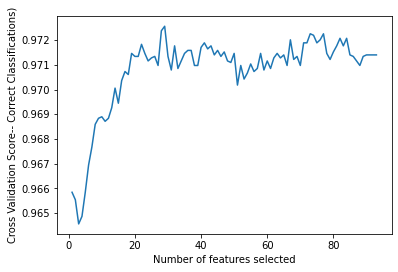

In [231]:
print('Optimal Number of Features for Model : %d' % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross Validation Score-- Correct Classifications)")
plt.plot(range(min_features_to_select,
               len(rfecv.grid_scores_) + min_features_to_select),
         rfecv.grid_scores_)
plt.show()

In [232]:
# Display features' names
most_relevent_cols = df_rfecv.iloc[:, 1:].columns[np.where(rfecv.support_ == True)]
print("Most relevant features are: ")
print(most_relevent_cols)

Most relevant features are: 
Index(['ROA(C)_before_interest_and_depreciation_before_interest', 'ROA(B)_before_interest_and_depreciation_after_tax', 'Non-industry_income_and_expenditure/revenue', 'Research_and_development_expense_rate', 'Interest-bearing_debt_interest_rate', 'Net_Value_Per_Share_(B)', 'Persistent_EPS_in_the_Last_Four_Seasons', 'Total_Asset_Growth_Rate', 'Net_Value_Growth_Rate', 'Total_Asset_Return_Growth_Rate_Ratio', 'Current_Ratio', 'Quick_Ratio', 'Interest_Expense_Ratio', 'Total_debt/Total_net_worth', 'Borrowing_dependency', 'Accounts_Receivable_Turnover', 'Average_Collection_Days', 'Revenue_per_person', 'Allocation_rate_per_person', 'Cash/Total_Assets', 'Quick_Assets/Current_Liability', 'Inventory/Working_Capital', 'Working_Capital/Equity', 'Current_Liabilities/Equity', 'Total_income/Total_expense', 'Cash_Flow_to_Equity', 'Net_Income_to_Total_Assets', 'Net_Income_to_Stockholders_Equity', 'Degree_of_Financial_Leverage_(DFL)'], dtype='object')


In [233]:
# Append target
most_relevent_cols = list(most_relevent_cols)
most_relevent_cols.append("Bankrupt?")

In [234]:
# Display df
rfecv_df = df[most_relevent_cols]
rfecv_df.head()

,ROA(C)_before_interest_and_depreciation_before_interest,ROA(B)_before_interest_and_depreciation_after_tax,Non-industry_income_and_expenditure/revenue,Research_and_development_expense_rate,Interest-bearing_debt_interest_rate,Net_Value_Per_Share_(B),Persistent_EPS_in_the_Last_Four_Seasons,Total_Asset_Growth_Rate,Net_Value_Growth_Rate,Total_Asset_Return_Growth_Rate_Ratio,Current_Ratio,Quick_Ratio,Interest_Expense_Ratio,Total_debt/Total_net_worth,Borrowing_dependency,Accounts_Receivable_Turnover,Average_Collection_Days,Revenue_per_person,Allocation_rate_per_person,Cash/Total_Assets,Quick_Assets/Current_Liability,Inventory/Working_Capital,Working_Capital/Equity,Current_Liabilities/Equity,Total_income/Total_expense,Cash_Flow_to_Equity,Net_Income_to_Total_Assets,Net_Income_to_Stockholders_Equity,Degree_of_Financial_Leverage_(DFL),Bankrupt?
0,0.370594,0.405750,0.302646,0.0,0.000725,0.147950,0.169141,4.980000e+09,0.000327,0.263100,0.002259,0.001208,0.629951,0.021266,0.390284,0.001814,0.003487,0.034164,0.037135,0.004094,0.001997,0.276920,0.721275,0.339077,0.002022,0.312905,0.716845,0.827890,0.026601,1
1,0.464291,0.516730,0.303556,0.0,0.000647,0.182251,0.208944,6.110000e+09,0.000443,0.264516,0.006016,0.004039,0.635172,0.012502,0.376760,0.001286,0.004917,0.006889,0.012335,0.014948,0.004136,0.289642,0.731975,0.329740,0.002226,0.314163,0.795297,0.839969,0.264577,1
2,0.426071,0.472295,0.302035,25500000.0,0.000790,0.177911,0.180581,7.280000e+09,0.000396,0.264184,0.011543,0.005348,0.629631,0.021248,0.379093,0.001495,0.004227,0.028997,0.141016,0.000991,0.006302,0.277456,0.742729,0.334777,0.002060,0.314515,0.774670,0.836774,0.026555,1
3,0.399844,0.457733,0.303350,0.0,0.000449,0.154187,0.193722,4.880000e+09,0.000382,0.263371,0.004194,0.002896,0.630228,0.009572,0.379743,0.001966,0.003215,0.015463,0.021320,0.018851,0.002961,0.276580,0.729825,0.331509,0.001831,0.302382,0.739555,0.834697,0.026697,1
4,0.465022,0.522298,0.303475,0.0,0.000686,0.167502,0.212537,5.510000e+09,0.000439,0.265218,0.006022,0.003727,0.636055,0.005150,0.375025,0.001449,0.004367,0.058111,0.023988,0.014161,0.004275,0.287913,0.732000,0.330726,0.002224,0.311567,0.795016,0.839973,0.024752,1


In [235]:
rfecv_df.shape

(6819, 30)

In [236]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# SMOTE strategy with both over and undersampling
k_values = [1,2,3,4,5,6,7,8,9,10]
for k in k_values:
    
    over = SMOTE(sampling_strategy=0.1, random_state=42, k_neighbors=k)
    under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
    classifier = XGBClassifier(random_state=42)    
    
    
    
# establish steps for pipeline
    steps= [('over', over), ('under', under), ('classifier', classifier)]
    pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
    stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

    repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

    param_grid = {'classifier__n_estimators':[100,120]}
    
    grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_sm_rfecv = grid_search.fit(X_train_rfecv, y_train_rfecv)
score_sm_rfecv = model_xgb_sm_rfecv.best_score_
y_pred_sm_rfecv = model_xgb_sm_rfecv.predict(X_val_rfecv)
val_score_sm_rfecv = model_xgb_sm_rfecv.score(X_val_rfecv, y_val_rfecv)

In [237]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_rfecv, y_pred_sm_rfecv))
print(f'Best ROC_AUC score : {score_sm_rfecv}\nValidation ROC_AUC score: {val_score_sm_rfecv}')

Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1313
           1       0.33      0.69      0.45        51

    accuracy                           0.94      1364
   macro avg       0.66      0.82      0.71      1364
weighted avg       0.96      0.94      0.95      1364

Best ROC_AUC score : 0.9412949690387697
Validation ROC_AUC score: 0.9326493735346385


In [238]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# SMOTE strategy with both over and undersampling
k_values = [1,2,3,4,5,6,7,8,9,10]
for k in k_values:
    
    over = SMOTE(sampling_strategy=0.1, random_state=42, k_neighbors=k)
    under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
    classifier = XGBClassifier(random_state=42)

# establish steps for pipeline
    steps= [('over', over), ('under', under), ('classifier', classifier)]
    pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
    stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

    repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

    param_grid = {'classifier__n_estimators':[100,200]}

    grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_sm_rfecv = grid_search.fit(X_train_rfecv, y_train_rfecv)
score_sm_rfecv = model_xgb_sm_rfecv.best_score_
y_pred_sm_rfecv = model_xgb_sm_rfecv.predict(X_val_rfecv)
val_score_sm_rfecv = model_xgb_sm_rfecv.score(X_val_rfecv, y_val_rfecv)

In [239]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val_rfecv, y_pred))
print(f'Best ROC_AUC score : {score}\nValidation ROC_AUC score: {val_score}')

Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: 
Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      1313
           1       0.24      0.69      0.36        51

    accuracy                           0.91      1364
   macro avg       0.61      0.80      0.65      1364
weighted avg       0.96      0.91      0.93      1364

Best ROC_AUC score : 0.9276572364925806
Validation ROC_AUC score: 0.8261875961351792


**Create Limited Model for APP**

In [240]:
# make a copy of the data set
df_app = df.copy()

In [241]:
# keep 5 most important features according to permutation importance
df_app.drop(columns=['ROA(C)_before_interest_and_depreciation_before_interest', 
                              'ROA(A)_before_interest_and_%_after_tax', 'ROA(B)_before_interest_and_depreciation_after_tax', 
                              'Operating_Gross_Margin', 'Realized_Sales_Gross_Margin', 'Operating_Profit_Rate', 
                              'Pre-tax_net_Interest_Rate', 'After-tax_net_Interest_Rate', 
                              'Non-industry_income_and_expenditure/revenue', 'Continuous_interest_rate_(after_tax)', 
                              'Operating_Expense_Rate', 'Research_and_development_expense_rate', 'Cash_flow_rate', 
                              'Tax_rate_(A)', 'Net_Value_Per_Share_(B)', 'Net_Value_Per_Share_(A)', 'Net_Value_Per_Share_(C)',
                              'Persistent_EPS_in_the_Last_Four_Seasons', 'Cash_Flow_Per_Share', 
                              'Operating_Profit_Per_Share_(Yuan_¥)', 'Per_Share_Net_profit_before_tax_(Yuan_¥)', 
                              'Realized_Sales_Gross_Profit_Growth_Rate', 'Operating_Profit_Growth_Rate', 
                              'After-tax_Net_Profit_Growth_Rate', 'Regular_Net_Profit_Growth_Rate', 
                              'Continuous_Net_Profit_Growth_Rate', 'Total_Asset_Growth_Rate', 'Total_Asset_Return_Growth_Rate_Ratio', 
                              'Cash_Reinvestment_%','Interest_Expense_Ratio', 'Debt_ratio_%', 'Net_worth/Assets', 
                              'Borrowing_dependency', 'Contingent_liabilities/Net_worth', 'Operating_profit/Paid-in_capital', 
                              'Net_profit_before_tax/Paid-in_capital', 'Inventory_and_accounts_receivable/Net_value', 
                              'Total_Asset_Turnover', 'Inventory_Turnover_Rate_(times)', 'Net_Worth_Turnover_Rate_(times)', 
                              'Operating_profit_per_person', 'Working_Capital_to_Total_Assets', 'Quick_Assets/Total_Assets', 
                              'Current_Assets/Total_Assets', 'Cash/Total_Assets', 'Current_Liability_to_Assets', 
                              'Operating_Funds_to_Liability', 'Inventory/Working_Capital', 'Current_Liabilities/Liability', 
                              'Working_Capital/Equity', 'Current_Liabilities/Equity', 'Retained_Earnings_to_Total_Assets', 
                              'Total_expense/Assets', 'Quick_Asset_Turnover_Rate', 'Working_capitcal_Turnover_Rate', 
                              'Cash_Turnover_Rate', 'Cash_Flow_to_Sales', 'Current_Liability_to_Liability', 
                              'Equity_to_Long-term_Liability', 'Cash_Flow_to_Total_Assets', 'Cash_Flow_to_Liability', 
                              'CFO_to_Assets','Cash_Flow_to_Equity', 'Current_Liability_to_Current_Assets', 
                              'Net_Income_to_Total_Assets', 'No-credit_Interval', 'Gross_Profit_to_Sales', 
                              'Net_Income_to_Stockholders_Equity', 'Liability_to_Equity', 'Degree_of_Financial_Leverage_(DFL)',
                              'Interest_Coverage_Ratio_(Interest_expense_to_EBIT)', 'Equity_to_Liability',
                              'ROA(C)_before_interest_and_depreciation_before_interest', 
                              'ROA(B)_before_interest_and_depreciation_after_tax', 'Non-industry_income_and_expenditure/revenue', 
                              'Research_and_development_expense_rate', 'Interest-bearing_debt_interest_rate', 'Net_Value_Per_Share_(B)', 
                              'Persistent_EPS_in_the_Last_Four_Seasons', 'Total_Asset_Growth_Rate', 'Net_Value_Growth_Rate', 
                              'Total_Asset_Return_Growth_Rate_Ratio', 'Current_Ratio', 'Quick_Ratio', 'Interest_Expense_Ratio', 
                              'Borrowing_dependency', 'Revenue_per_person', 'Allocation_rate_per_person', 'Cash/Total_Assets', 
                              'Inventory/Working_Capital', 'Working_Capital/Equity', 'Current_Liabilities/Equity',
                              'Cash_Flow_to_Equity', 'Net_Income_to_Total_Assets', 'Net_Income_to_Stockholders_Equity',
                              'Degree_of_Financial_Leverage_(DFL)','Revenue_Per_Share_(Yuan_¥)','Long-term_fund_suitability_ratio_(A)',
                              'Fixed_Assets_Turnover_Frequency','Cash/Current_Liability','Inventory/Current_Liability',
                              'Long-term_Liability_to_Current_Assets','Current_Asset_Turnover_Rate','Fixed_Assets_to_Assets',
                              'Liability-Assets_Flag','Total_assets_to_GNP_price'], inplace=True)

In [242]:
# qcuik check of the features
df_app.head()

,Bankrupt?,Total_debt/Total_net_worth,Accounts_Receivable_Turnover,Average_Collection_Days,Quick_Assets/Current_Liability,Total_income/Total_expense
0,1,0.021266,0.001814,0.003487,0.001997,0.002022
1,1,0.012502,0.001286,0.004917,0.004136,0.002226
2,1,0.021248,0.001495,0.004227,0.006302,0.002060
3,1,0.009572,0.001966,0.003215,0.002961,0.001831
4,1,0.005150,0.001449,0.004367,0.004275,0.002224


In [243]:
# split our feature matrix and target vector
y = df_app['Bankrupt?']
X = df_app.drop('Bankrupt?', axis=1)

# train-validation split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [244]:
# Use SMOTE from imblear.over_sampling to balance the data:
# SMOTE: Synthetic Minority Oversampling Technique
# XGBClassifier with StratifiedKFold or RepeatedStratifiedKFold

# SMOTE strategy with both over and undersampling
k_values = [1,2,3,4,5,6,7,8,9,10]
for k in k_values:
    
    over = SMOTE(sampling_strategy=0.1, random_state=42, k_neighbors=k)
    under = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
    classifier = XGBClassifier(random_state=42)

# establish steps for pipeline
    steps= [('over', over), ('under', under), ('classifier', classifier)]
    pipeline = imbpipeline(steps=steps)

#sm = SMOTE(random_state=42,sampling_strategy=0.1 )

#pipeline = imbpipeline(steps = [['sm', SMOTE(random_state=42)],
                              # ['classifier', XGBClassifier(random_state=42)]])

    
    stratified_kfold = StratifiedKFold(n_splits=3, 
                                  shuffle=True,
                                  random_state=42)

    repeated_kfold = RepeatedStratifiedKFold(n_splits=10, 
                                         n_repeats=3, 
                                         random_state=42)

    param_grid = {'classifier__n_estimators':[100,200]}

    grid_search = GridSearchCV(estimator=pipeline,
                          param_grid=param_grid,
                          scoring='roc_auc',
                          cv=repeated_kfold,
                          n_jobs=-1)

model_xgb_app = grid_search.fit(X_train, y_train)
score = model_xgb_app.best_score_
y_pred = model_xgb_app.predict(X_val)
val_score = model_xgb_app.score(X_val, y_val)

In [245]:
print('Classification report- XGBClassifier with Repeated Stratified K Fold Paired With: ')
print('Synthetic Minority Class Oversampling & Random Under Sampling of Majortity Class Technique\n')
print(classification_report(y_val, y_pred))
print(f'Best ROC_AUC score : {score}\nValidation ROC_AUC score: {val_score}')